# Interactive Graphs

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

url = 'https://github.com/jiechengh/mgt301/blob/main/airbnb_sin_nyc.csv?raw=true'
airbnb = pd.read_csv(url, index_col=0)
airbnb.dropna(inplace=True)
airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,City
id,,,,,,,,,,,,,,,,
49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365,Singapore
50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365,Singapore
56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365,Singapore
71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353,Singapore
71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355,Singapore


In [2]:
numeric_cols = ['price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
               'calculated_host_listings_count', 'availability_365']

def drop_outliers_iqr(df, column, selected_cols):
    if column in selected_cols:
        q1 = df[column].quantile(0.25)
        q3 = df[column].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        no_outliers = df[(df[column] >= lower) & (df[column] <= upper)]
        return no_outliers
    
    else:
        return df

for col in airbnb.columns:
    airbnb = drop_outliers_iqr(airbnb, col, numeric_cols)

In [3]:
sns.set_palette('Set2')
sns.set_style('dark')

https://account.mapbox.com/access-tokens/

In [4]:
import plotly.express as px
token = 'pk.eyJ1IjoidHNoamMiLCJhIjoiY2xld2JvaWpkMGM0dTNwbGVtZ28xdjJpZyJ9.k7s2Irbkgka5eWTMzWuGpg'
px.set_mapbox_access_token(token)
# Allow you to have access to the map.

https://plotly.com/python/builtin-colorscales/

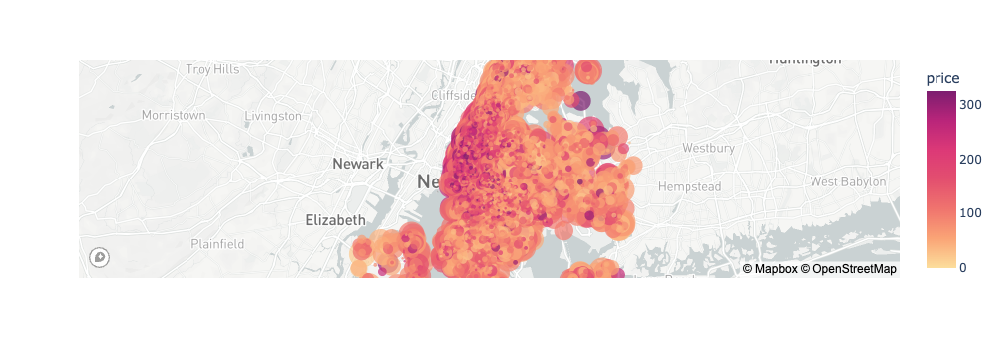

In [5]:
px.scatter_mapbox(airbnb[airbnb['City']=='NYC'], lat='latitude', lon='longitude', 
                  color='price', size='number_of_reviews', 
                  color_continuous_scale=px.colors.sequential.Sunsetdark, zoom=9)

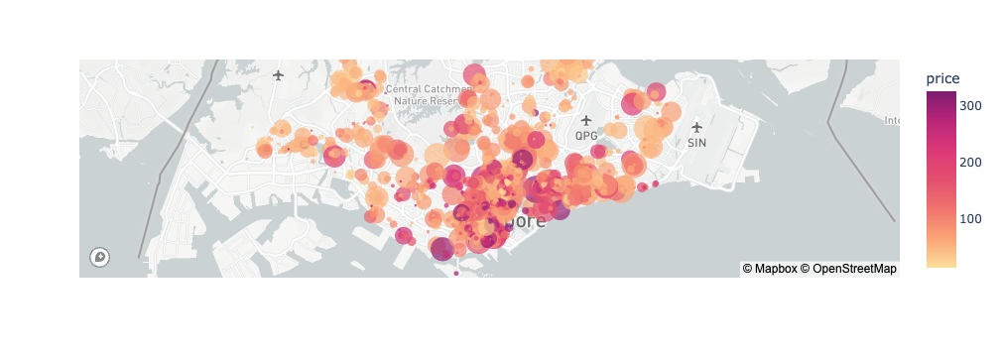

In [6]:
px.scatter_mapbox(airbnb[airbnb['City']=='Singapore'], lat='latitude', lon='longitude', 
                  color='price', size='number_of_reviews', 
                  color_continuous_scale=px.colors.sequential.Sunsetdark, zoom=10)


In [7]:
spacious = airbnb['name'].str.contains('spacious', case=False)
# case: letter case. case true: means make difference in upper or lower case 
spacious

id
553229      False
756300      False
833289      False
888196      False
918880      False
            ...  
36411407    False
36425863    False
36438336    False
36442252    False
36455809    False
Name: name, Length: 25245, dtype: bool

In [8]:
sum(spacious)

2369

In [9]:
spacious_airbnb = airbnb[spacious]
spacious_airbnb.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,City
id,,,,,,,,,,,,,,,,
1060046,S$950/mth spacious room for short/long term lease,5748910,Sarah,West Region,Bukit Panjang,1.38123,103.76874,Private room,49,3,15,2019-06-01,0.20,2,131,Singapore
4561463,Spacious master bedroom,23314147,Isabel,Central Region,River Valley,1.29702,103.84145,Private room,119,2,1,2015-01-01,0.02,1,0,Singapore
4818191,"""A""-Private Bathroom Spacious Bedrm",3523910,Julian,Central Region,Bukit Timah,1.33179,103.76640,Private room,87,5,18,2018-10-03,0.36,3,269,Singapore
5214091,Spacious 1 Bedroom Apt,3274080,Edwina,East Region,Bedok,1.30877,103.90962,Entire home/apt,90,2,21,2019-08-11,0.39,2,29,Singapore
5939811,"SPACIOUS 2-BED, HEART OF THE CITY",8097223,Natasha,Central Region,Tanglin,1.29376,103.82802,Entire home/apt,281,3,8,2016-02-12,0.16,1,0,Singapore


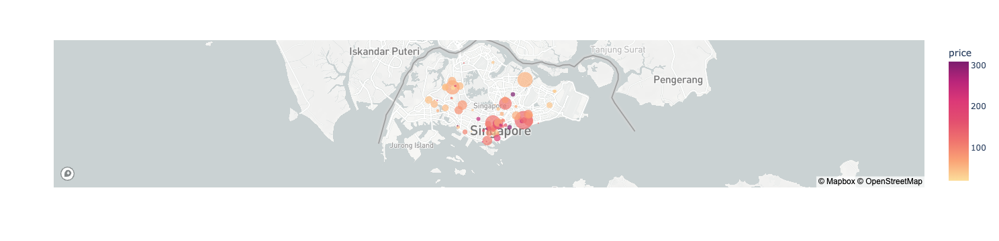

In [23]:
px.scatter_mapbox(spacious_airbnb[spacious_airbnb['City']=='Singapore'], lat='latitude', lon='longitude', 
                  color='price', size='number_of_reviews', 
                  color_continuous_scale=px.colors.sequential.Sunsetdark, zoom=9)

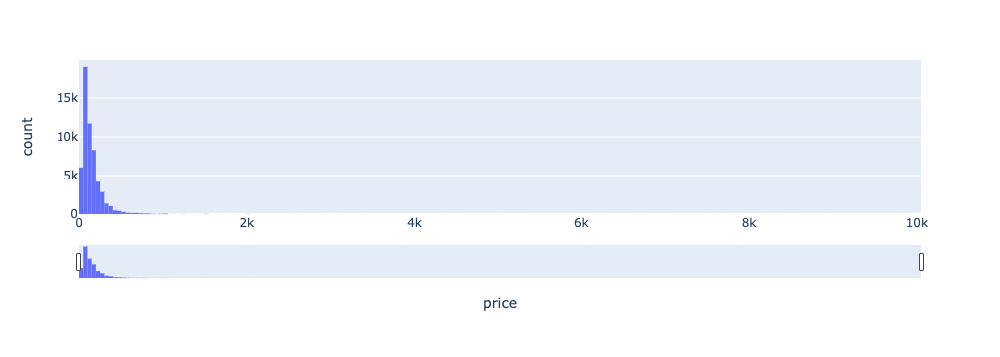

In [11]:
df = pd.read_csv(url, index_col=0)
fig = px.histogram(df, x='price', nbins=500)
fig.update_layout(xaxis=dict(rangeslider=dict(visible=True), type='linear'))


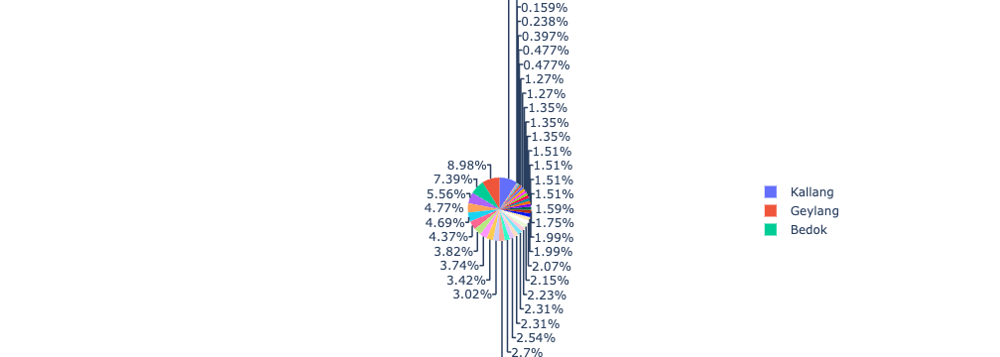

In [12]:
sin = airbnb[airbnb['City']=='Singapore'].groupby('neighbourhood').size()\
    .reset_index(name='count').sort_values('count')
px.pie(sin, names='neighbourhood', values='count')

# Scatter Plot

<AxesSubplot:title={'center':'number_of_reviews vs reviews_per_month'}, xlabel='number_of_reviews', ylabel='reviews_per_month'>

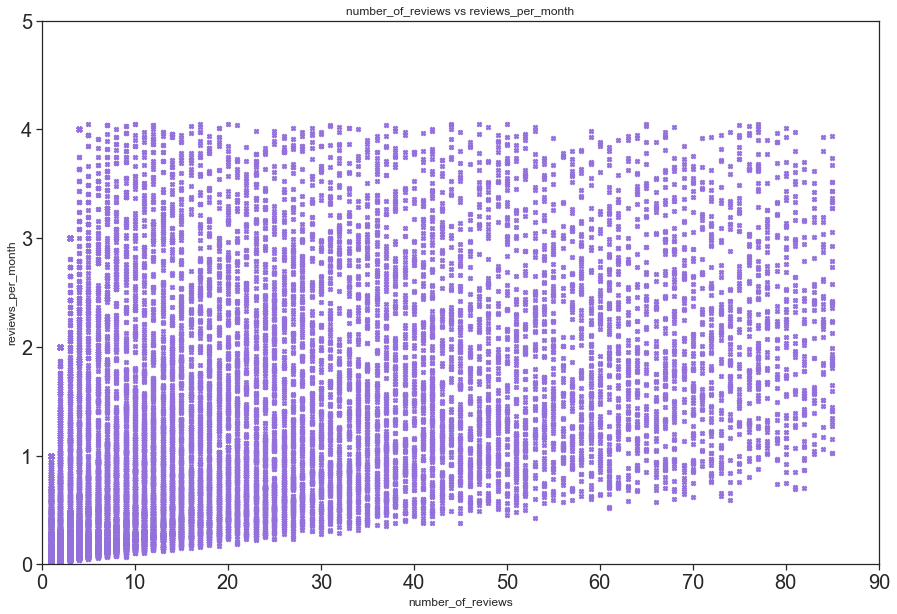

In [22]:
fig, ax=plt.subplots()

airbnb.plot(kind="scatter", x="number_of_reviews", y="reviews_per_month", ax = ax, color='mediumpurple',marker='X',\
             title="number_of_reviews vs reviews_per_month",figsize=(15,10),xlim=(0,90),ylim=(0,5), fontsize=20)
#Formatting
#ax.set_xlabel('XXXX')
#ax.set_ylabel('YYYY')
#ax.set_title('TTTT')
# If we don't include this labels inside the (), we can add them outside

# Histogram

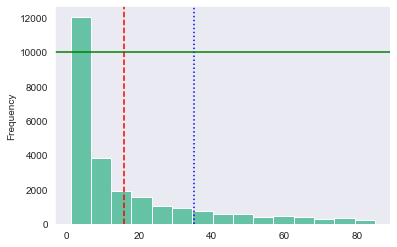

In [14]:
nor_mean = airbnb.number_of_reviews.mean()
nor_sd = airbnb.number_of_reviews.std()

fig, ax=plt.subplots()

airbnb.number_of_reviews.plot(kind='hist', bins=15, ax= ax)
ax.axvline(nor_mean, color ='red', linestyle='--')
ax.axvline(nor_mean+nor_sd, color='blue', linestyle=':') #vertical line
ax.axhline(10000,color='g', linestyle='-') #horizontal line

# Line Plot

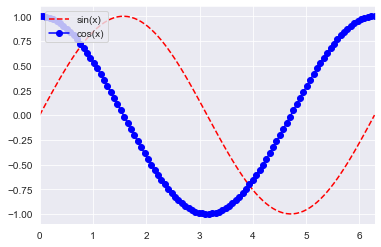

In [15]:
import numpy as np
fig, ax=plt.subplots()

X= np.linspace(0,2*np.pi, 100)
Y1=np.sin(X)
Y2=np.cos(X)
ax.plot(X,Y1,linestyle='--', color='red',label='sin(x)')
ax.plot(X,Y2,color='blue', marker='o', label = 'cos(x)')

ax.legend(loc='upper left')
ax.set_xlim([0,2*np.pi])
ax.grid(which='major',axis='both')

# Box Plot

number_of_reviews    AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

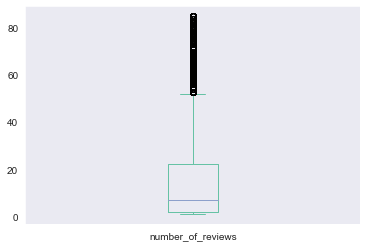

In [16]:
airbnb.number_of_reviews.plot(kind='box', subplots=True, layout=(1,1),
sharex=False, sharey=False)

# Bar Chart & Subplot

In [17]:
movie_final= pd.read_csv("movie.csv")

In [18]:
mf_crcg=movie_final[['content_rating', 'country', 'gross']].groupby(by=['country','content_rating']).count()
mf_crcg=mf_crcg.unstack()
mf_crcg=mf_crcg.fillna(0)
mf_crcg['Total']=mf_crcg.sum(axis=1)
mf_crcg=mf_crcg.sort_values(by="Total", ascending = True)
y=mf_crcg.sum(axis=1).max()
mf_crcg.drop('Total', axis=1, inplace=True)
mf_crcg_norm=mf_crcg.div(mf_crcg.sum(axis=1),axis=0)

In [19]:
fig = plt.figure()

ax1= fig.add_subplot(2,2,1)
ax2= fig.add_subplot(2,2,2)
mf_crcg.plot(kind='bar',stacked= True, title='Total counts of CR by Countries', figsize=(15,10), ax=ax1)

mf_crcg_norm.loc[["UK","USA"],:].plot(kind='bar',stacked= True, figsize=(15,10),
                                      ax=ax2,title='Count of Content Rating by Country')
# save figure
plt.savefig('Gross_Ctry_Genre.png')

plt.close()

# Scatter Matrix

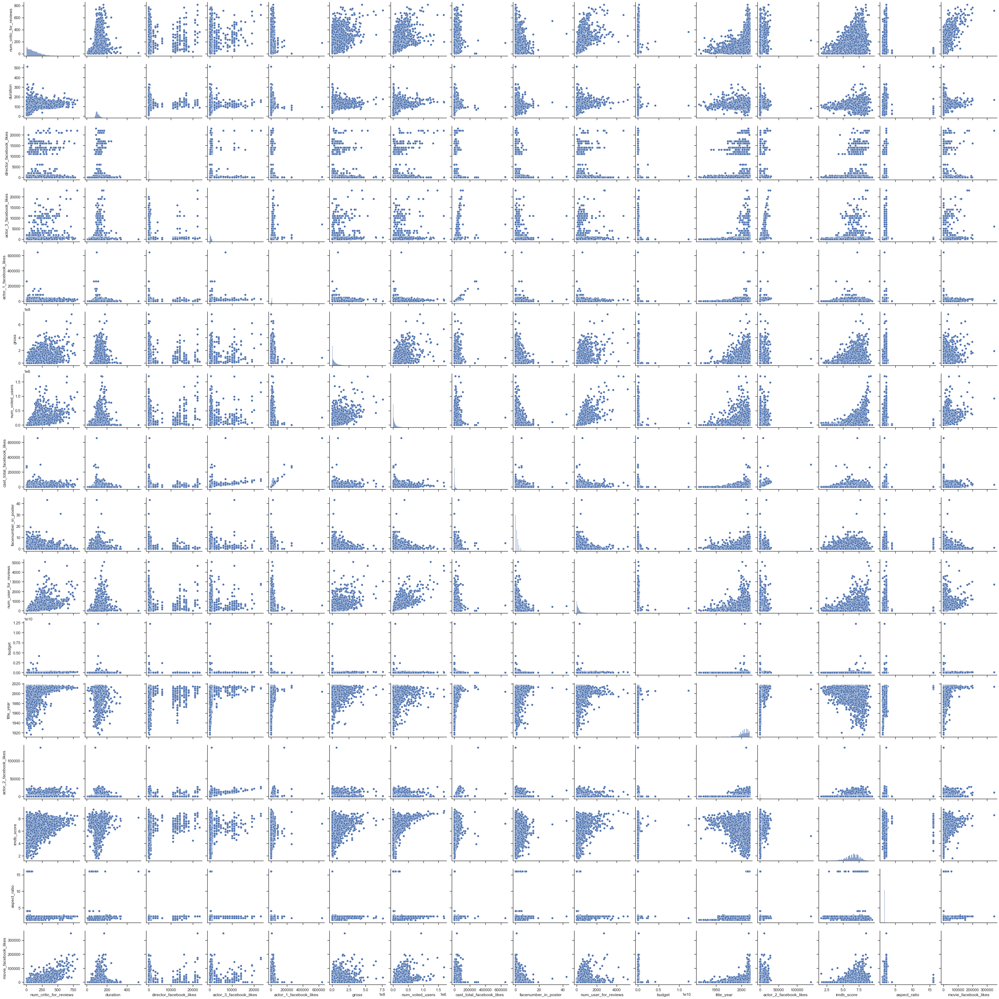

In [20]:
sns.set_theme(style="ticks")
sns.pairplot(movie_final)